# <img style="float: left; padding-right: 10px; width: 45px" src="https://upload.wikimedia.org/wikipedia/en/8/89/ExtensionFlag.png"> CSCI-E104: Advanced Deep Learning

## Lab 5 - Stable Diffusion Pipeline with Diffusers





**Harvard University**<br/>
**Spring 2026**<br/>



<hr style="height:2pt">

### Stable Diffusion Pipeline with 🤗 Diffusers

The StableDiffusionPipeline is a pipeline created by the 🤗 Diffusers library that allows us to generate images from text with just a few lines of code in Python. It has many versions and checkpoints available, which you can take a look at by visiting the Text-to-Image Generation page of the library documentation.

A "Stable Diffusion pipeline" refers to a set of processing steps used to generate images from text prompts, leveraging the Stable Diffusion model which is known for its high-quality image generation capabilities, stability in producing consistent results, and ability to handle complex prompts, making it a popular choice for various creative applications like AI art generation and image editing.

https://huggingface.co/docs/diffusers/api/pipelines/stable_diffusion/overview

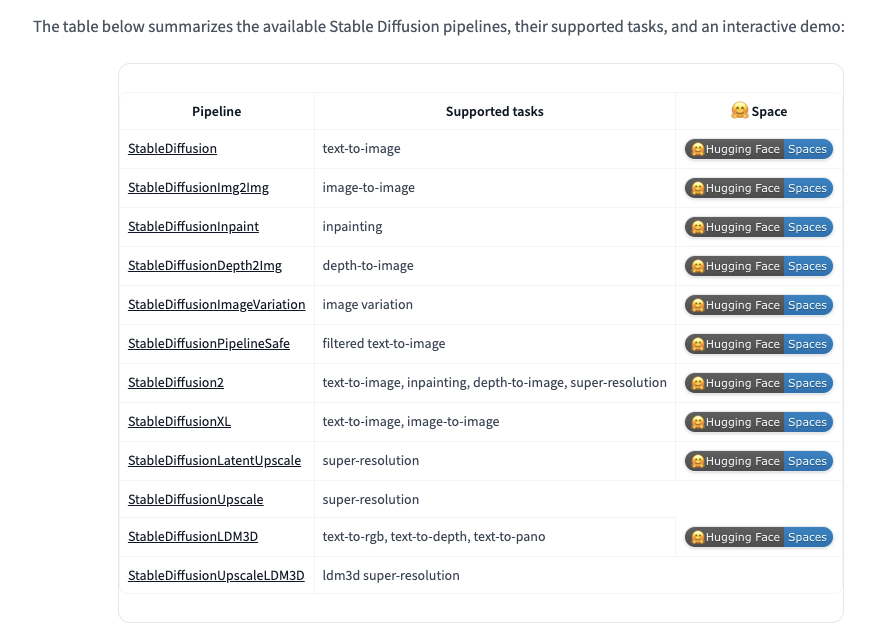

Additional official checkpoints for the different Stable Diffusion versions and tasks can be found on the CompVis, Runway, and Stability AI Hub organizations. 

Explore these organizations to find the best checkpoint for your use-case!

https://huggingface.co/docs/diffusers/api/pipelines/stable_diffusion/text2img

#### Build a Diffusers Pipeline and generate a simple image with a prompt.

In [11]:
# Installing diffusers library
!pip install -U diffusers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 18.3 MB/s eta 0:00:00
  Attempting uninstall: diffusers
    Found existing installation: diffusers 0.31.0
    Uninstalling diffusers-0.31.0:
      Successfully uninstalled diffusers-0.31.0


In [2]:
# Library imports

# Importing PyTorch library, for building and training neural networks
import torch

# Importing StableDiffusionPipeline to use pre-trained Stable Diffusion models
from diffusers import StableDiffusionPipeline

# Image is a class for the PIL module to visualize images in a Python Notebook
from PIL import Image

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [ ]:
# Creating pipeline
pipeline = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4",
                                                  torch_dtype=torch.float16)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

(…)kpoints/scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


In [ ]:
# Defining function for the creation of a grid of images
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size = (cols*w,
                                   rows * w))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box = (i%cols*w, i // cols*h))
    return grid

In [ ]:
# Moving pipeline to GPU
pipeline = pipeline.to('cuda')

  0%|          | 0/50 [00:00<?, ?it/s]

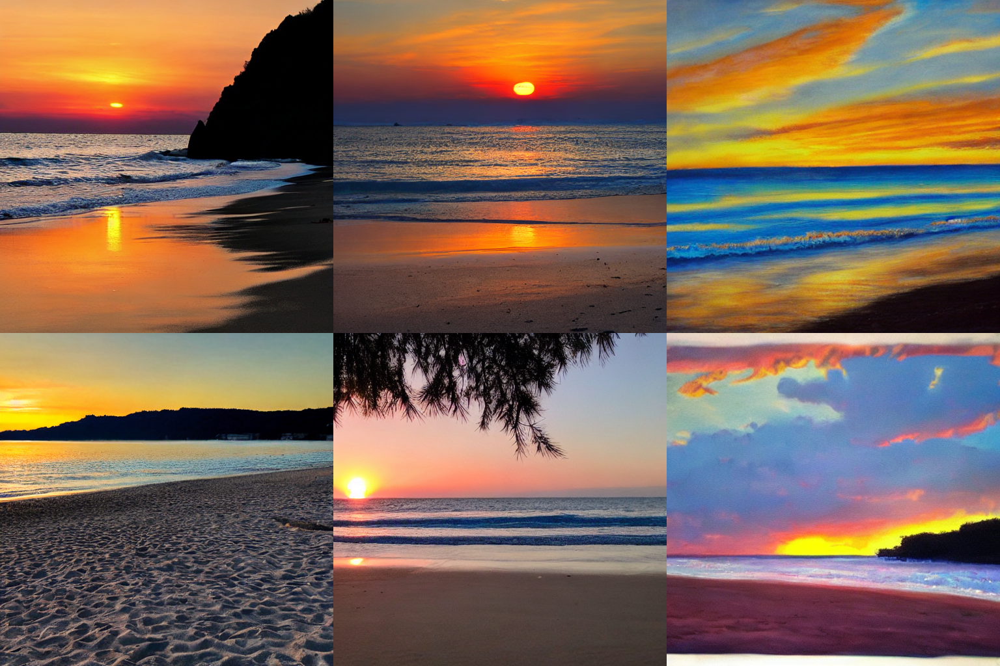

In [ ]:
n_images = 6 # Let's generate 6 images based on the prompt below
prompt = ['Sunset on a beach'] * n_images

images = pipeline(prompt).images

grid = image_grid(images, rows=2, cols = 3)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

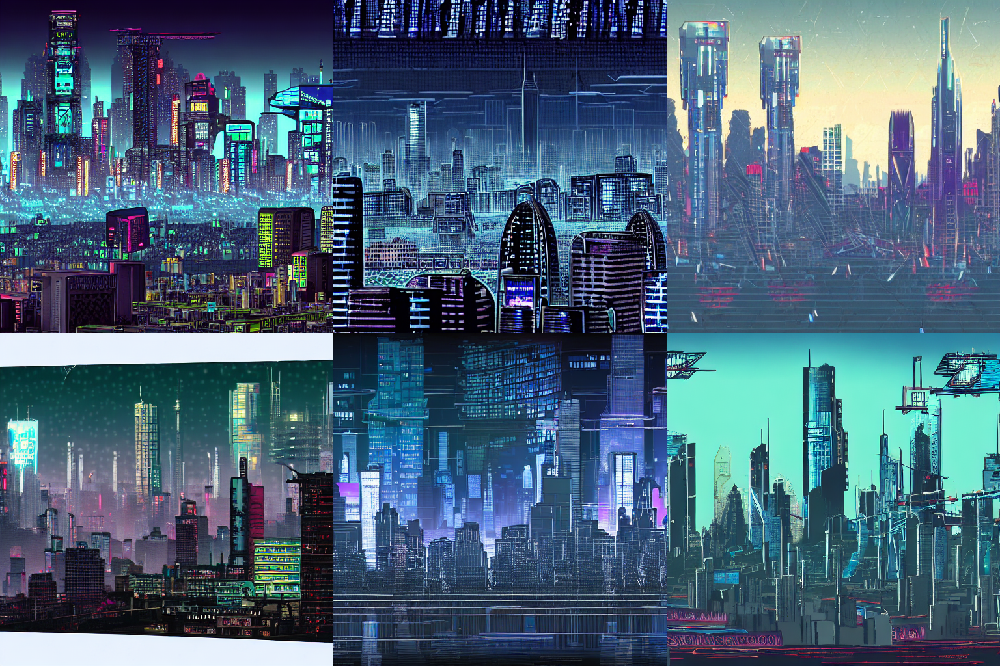

In [ ]:
n_images = 6
prompt = ['Skyline of a cyberpunk megalopolis'] * n_images

images = pipeline(prompt).images

grid = image_grid(images, rows=2, cols = 3)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

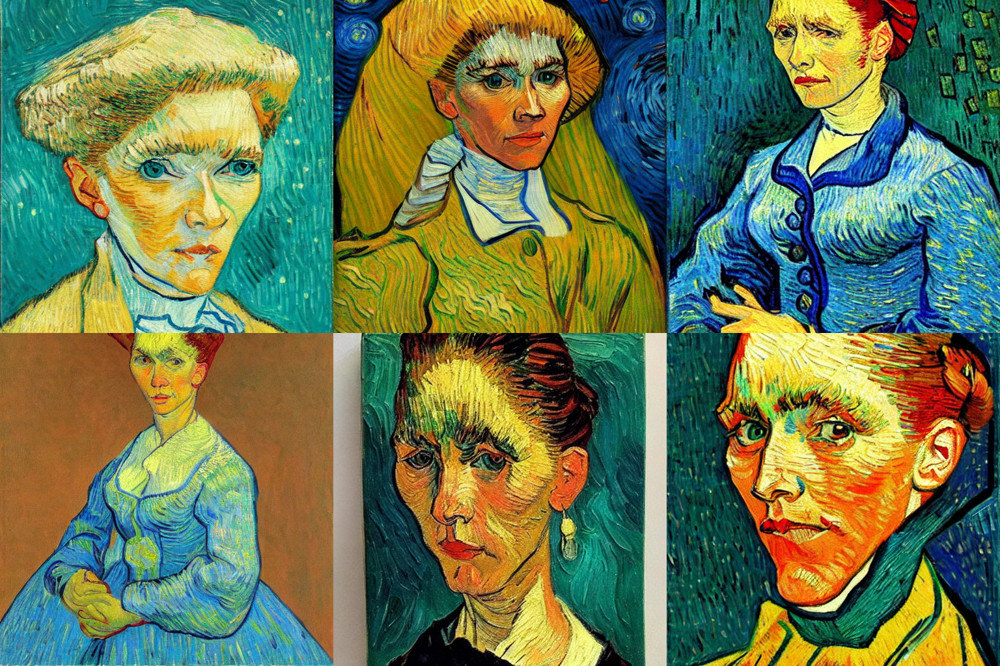

In [ ]:
n_images = 6
prompt = ['Painting of a woman in the style of Van Gogh'] * n_images

images = pipeline(prompt).images

grid = image_grid(images, rows=2, cols = 3)
grid

In [3]:
from diffusers import DiffusionPipeline
import torch

pipe_id = "stabilityai/stable-diffusion-xl-base-1.0"
pipe = DiffusionPipeline.from_pretrained(pipe_id, torch_dtype=torch.float16)
pipe.to("cuda");

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

text_encoder_2%2Fconfig.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer%2Fspecial_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer%2Ftokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

tokenizer%2Fmerges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler%2Fscheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

text_encoder%2Fconfig.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

tokenizer%2Fvocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2%2Fspecial_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_2%2Ftokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/10.3G [00:00<?, ?B/s]

unet%2Fconfig.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

vae%2Fconfig.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

#### Similar to Stable Diffusion WebUI, you can provide a positive prompt, a negative prompt, inference steps, set random seed, change the size, and guidance scale to generate the image

  0%|          | 0/50 [00:00<?, ?it/s]

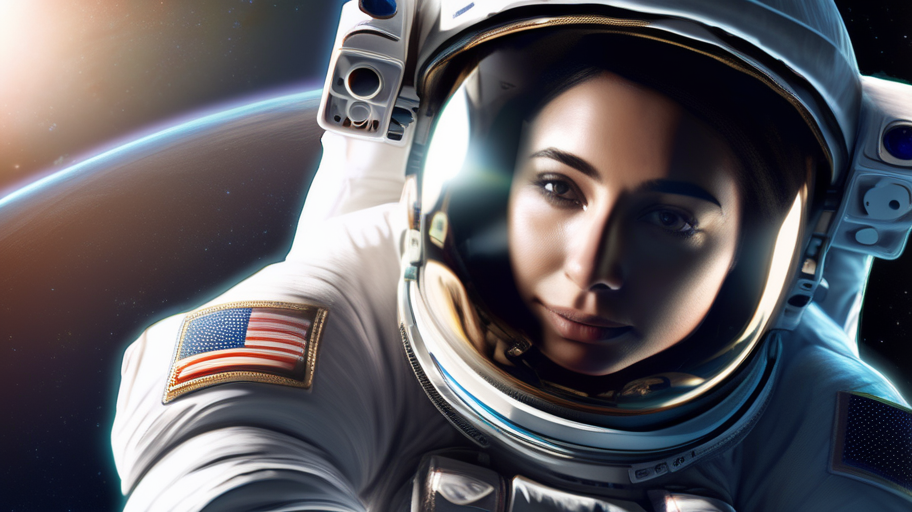

In [4]:
prompt = "Astronaut in space, realistic, detailed, 8k"
neg_prompt = "ugly, deformed, disfigured, poor details, bad anatomy"
generator = torch.Generator("cuda").manual_seed(127)

image = pipe(
    prompt,
    num_inference_steps=50,
    generator=generator,
    negative_prompt=neg_prompt,
    height=512,
    width=912,
    guidance_scale=6,
).images[0]

image

#### Variational AutoEncoder

A variational autoencoder (VAE) is a technique used to improve the quality of AI generated images you create with the text-to-image model Stable Diffusion. VAE encodes the image into a latent space and then that latent space is decoded into a new, higher quality image.



https://huggingface.co/docs/diffusers/api/pipelines/stable_diffusion/text2img

#### Create web demos using gradio

gradio is a library that makes creating beautiful and user-friendly machine learning apps on the web a breeze. 

https://huggingface.co/docs/diffusers/api/pipelines/stable_diffusion/overview#create-web-demos-using-gradio

In [2]:
!pip install gradio

  Using cached ffmpy-1.0.0-py3-none-any.whl.metadata (3.0 kB)
  Using cached semantic_version-2.10.0-py2.py3-none-any.whl.metadata (9.7 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.2/24.2 MB 14.1 MB/s eta 0:00:00m eta 0:00:010:01:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.0/56.0 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 12.3 MB/s eta 0:00:00
Using cached semantic_version-2.10.0-py2.py3-none-any.whl (15 kB)
Using cached ffmpy-1.0.0-py3-none-any.whl (5.6 kB)
  Attempting uninstall: typing-inspection
    Found existing installation: typing-inspection 0.4.1
    Uninstalling typing-inspection-0.4.1:
      Successfully uninstalled typing-inspection-0.4.1


In [1]:
from diffusers import StableDiffusionPipeline
import gradio as gr

pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4")

gr.Interface.from_pipeline(pipe).launch()

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


/Users/umarala/anaconda3/envs/env311/lib/python3.11/site-packages/bitsandbytes/cextension.py:34: UserWarning: The installed version of bitsandbytes was compiled without GPU support. 8-bit optimizers, 8-bit multiplication, and GPU quantization are unavailable.
  warn("The installed version of bitsandbytes was compiled without GPU support. "


'NoneType' object has no attribute 'cadam32bit_grad_fp32'


/Users/umarala/anaconda3/envs/env311/lib/python3.11/site-packages/diffusers/models/transformers/transformer_kandinsky.py:168: UserWarning: CUDA is not available or torch_xla is imported. Disabling autocast.
  @torch.autocast(device_type="cuda", dtype=torch.float32)
/Users/umarala/anaconda3/envs/env311/lib/python3.11/site-packages/diffusers/models/transformers/transformer_kandinsky.py:272: UserWarning: CUDA is not available or torch_xla is imported. Disabling autocast.
  @torch.autocast(device_type="cuda", dtype=torch.float32)


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

* Running on local URL:  http://127.0.0.1:7861
* To create a public link, set `share=True` in `launch()`.


  0%|          | 0/50 [00:00<?, ?it/s]

#### References

https://medium.com/latinxinai/text-to-image-with-stable-diffusion-4df16da2cfd5

https://huggingface.co/docs/diffusers/main/en/index

https://huggingface.co/docs/diffusers/main/en/api/diffusion_pipeline

